# import

In [1]:
import kornia
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
from tqdm import tqdm

# Q1. canny detection

In [2]:
# helper function to show an image of pytorch tensor
def show(img, cmap='gray', figsize=(10, 10), title="", top=1.5):
    img = img.to(torch.uint8)
    if len(img.shape) == 3:
        print('showing 3d image')
        fig = plt.figure(figsize=figsize)
        npimg = img.numpy()
        # add title
        plt.title(title)
        plt.box(False)
        plt.axis('off')
        plt.imshow(np.transpose(npimg, (1, 2, 0)), cmap=cmap)
    elif len(img.shape) == 4:
        print('showing 4d image')            
        if img.shape[0] == 1:
            fig = plt.figure(figsize=figsize)
            img = img.squeeze(0)
            npimg = img.numpy()
            plt.title(title)
            plt.box(False)
            plt.axis('off')
            plt.imshow(np.transpose(npimg, (1, 2, 0)), cmap=cmap)
        else:
            # display a grid of images
            num = img.shape[0]
            fig, axes = plt.subplots(1, num, figsize=figsize)
            for i in range(num):
                axes[i].imshow(img[i].permute(1, 2, 0), cmap=cmap)
                axes[i].axis('off')
                axes[i].set_title(title[i])
            # plt.subplots_adjust(top=top)  # Adjust the top parameter to control the space between the title and the plot
            # plt.suptitle(title)
            plt.show()
    else:
        raise ValueError('Invalid image shape f{img.shape}')
    
def three_channel_gray(img):
    return torch.cat([img, img, img], dim=1)

original img shape: torch.Size([1, 3, 1312, 1600]), grayscale img shape: torch.Size([1, 1, 1312, 1600])
showing 4d image


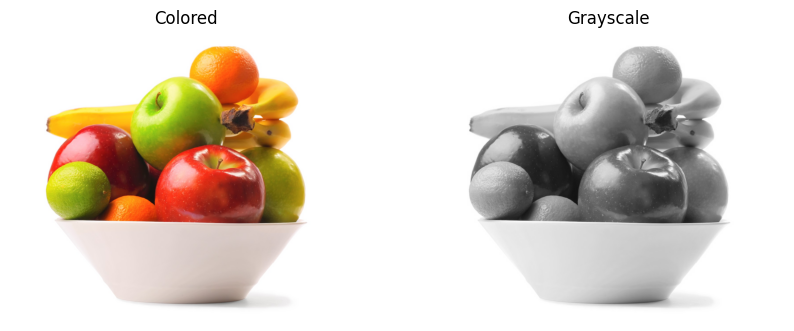

In [86]:
# read img with torchvision
energy_img = torchvision.io.read_image("img/bowl-of-fruit.jpg")

# convert to (B, C, H, W) format and show
energy_img = energy_img.to(torch.float32).unsqueeze(0)

# convert to grayscale and show
gray_img = kornia.color.rgb_to_grayscale(energy_img)

print(f"original img shape: {energy_img.shape}, grayscale img shape: {gray_img.shape}")

img_pile = torch.cat([energy_img, three_channel_gray(gray_img)], dim=0)
show(img_pile, title=["Colored", "Grayscale"])

showing 4d image


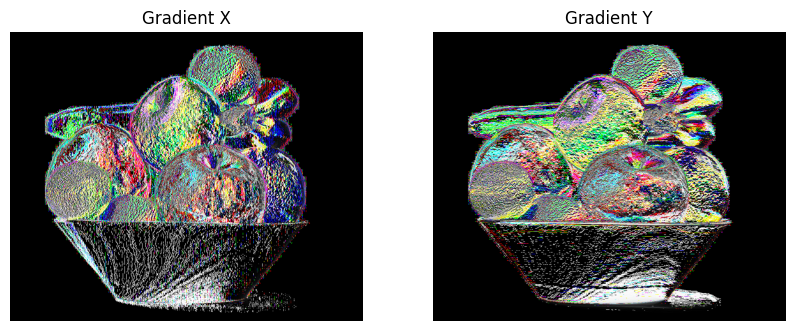

In [87]:
gradient = kornia.filters.spatial_gradient(energy_img, mode='sobel', normalized=False) # [1, 3, 2, 1312, 1600]
gradient_x = gradient[:, :, 0]
gradient_y = gradient[:, :, 1] # [1, 3, 1312, 1600]
show(torch.stack([gradient_x, gradient_y],dim=0).squeeze(1), title=["Gradient X", "Gradient Y"])

showing 4d image


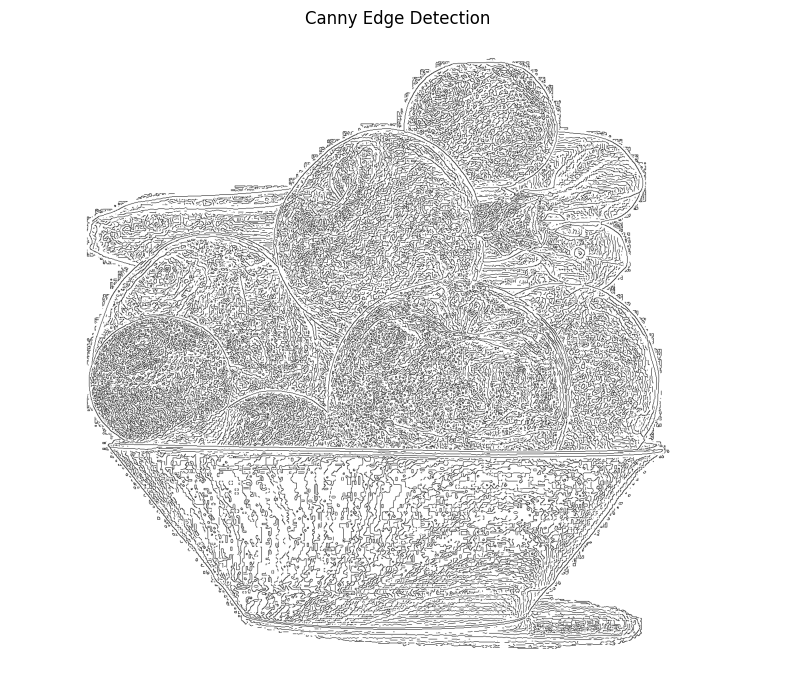

In [91]:
canny_img = kornia.filters.canny(gray_img)[0]

# cat the images in pytorch
show(1 - canny_img.clamp(0., 1.), cmap='gray', title="Canny Edge Detection")

showing 4d image


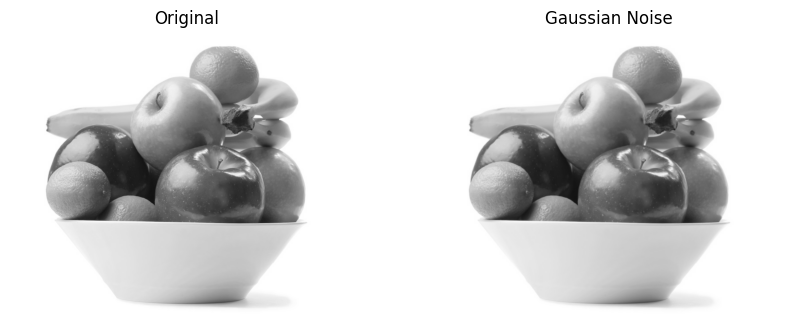

In [94]:
# step 1: add noise to the image

def add_noise(img, sigma):
    # input: img (B, C, H, W), sigma (float)
    # output: img (B, C, H, W)
    return  kornia.filters.gaussian_blur2d(gray_img, (5, 5), (sigma, sigma))

gau_img = add_noise(gray_img, 1.0)

img_pile = torch.cat([three_channel_gray(gray_img), three_channel_gray(gau_img)], dim=0)
show(img_pile, title=["Original", "Gaussian Noise"])

showing 4d image


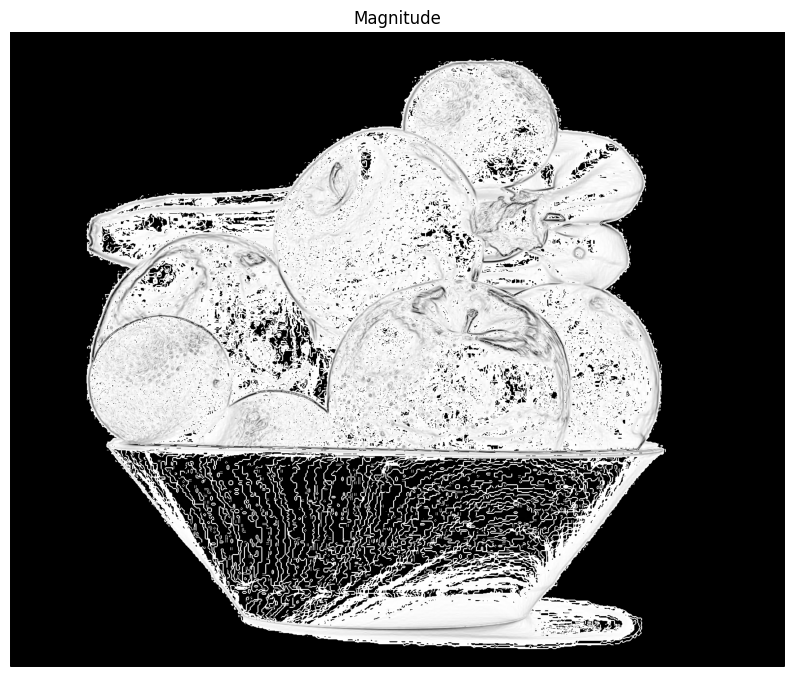

In [95]:
# step 2: compute the gradient magnitude and direction

def compute_gradient(gaussian_img):
    # input: gaussian_img (B, C, H, W)
    # output: magnitude (B, C, H, W), direction (B, C, H, W)
    kx = torch.tensor([[-1., 0., 1.], [-2., 0., 2.], [-1., 0., 1.]]).to(torch.float32)
    ky = torch.tensor([[-1., -2., -1.], [0., 0., 0.], [1., 2., 1.]]).to(torch.float32)

    # compute the gradients
    grad_x = F.conv2d(gaussian_img, kx.unsqueeze(0).unsqueeze(0), padding=1)
    grad_y = F.conv2d(gaussian_img, ky.unsqueeze(0).unsqueeze(0), padding=1)

    # compute the magnitude
    magnitude = torch.sqrt(grad_x**2 + grad_y**2)
    direction = torch.atan2(grad_y, grad_x)

    return magnitude, direction

magnitude, direction = compute_gradient(gau_img)
show(1 - magnitude, title="Magnitude")

showing 4d image


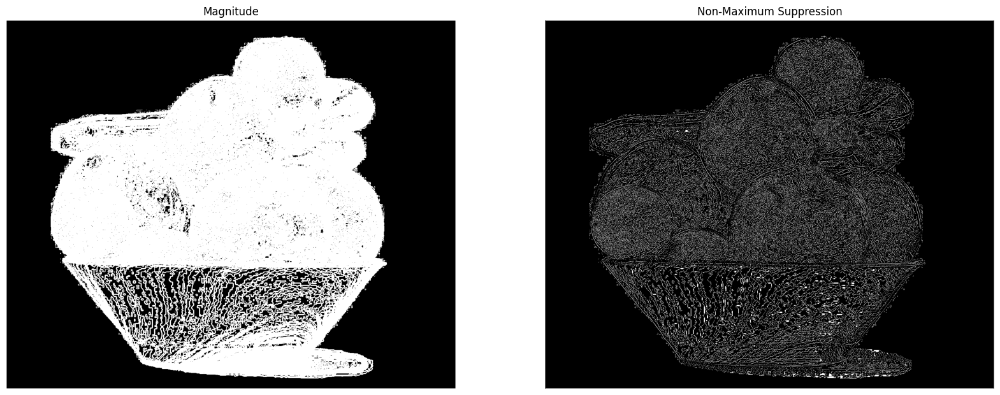

In [96]:
# step3: non-maximum suppression
def classify_direction(direction):
    # cast angles to 0, 45, 90, 135, 180
    # input: direction (B, C, H, W)
    # output: direction (B, C, H, W)
    direction = direction.squeeze(0).squeeze(0)
    angle = direction * 180. / np.pi
    angle[angle < 0] += 180
    angle = angle // 45 * 45

    # define the direction
    switch = {
        0: 0,
        45: 1,
        90: 2,
        135: 3,
        180: 0
    }
    for k, v in switch.items():
        direction[angle == k] = v
    return direction.unsqueeze(0).unsqueeze(0)

def non_max_suppression(magnitude, direction_45):
    # input: magnitude (B, C, H, W), direction_45 (B, C, H, W)
    # output: magnitude (B, C, H, W)
    magnitude = magnitude.squeeze(0).squeeze(0)
    direction_45 = direction_45.squeeze(0).squeeze(0)
    H, W = magnitude.shape

    for i in range(1, H-1):
        for j in range(1, W-1):
            if direction_45[i, j] == 0:
                if magnitude[i, j] < magnitude[i, j-1] or magnitude[i, j] < magnitude[i, j+1]:
                    magnitude[i, j] = 0
            elif direction_45[i, j] == 1:
                if magnitude[i, j] < magnitude[i-1, j+1] or magnitude[i, j] < magnitude[i+1, j-1]:
                    magnitude[i, j] = 0
            elif direction_45[i, j] == 2:
                if magnitude[i, j] < magnitude[i-1, j] or magnitude[i, j] < magnitude[i+1, j]:
                    magnitude[i, j] = 0
            elif direction_45[i, j] == 3:
                if magnitude[i, j] < magnitude[i-1, j-1] or magnitude[i, j] < magnitude[i+1, j+1]:
                    magnitude[i, j] = 0

    return magnitude.unsqueeze(0).unsqueeze(0)

def non_max_suppression_fast(magnitude, direction_45):
    # input: magnitude (B, C, H, W), direction_45 (B, C, H, W)
    # output: magnitude (B, C, H, W)
    magnitude = magnitude.clone()
    magnitude = magnitude.squeeze(0).squeeze(0)
    direction_45 = direction_45.squeeze(0).squeeze(0)

    pad = torch.nn.ConstantPad2d(1, 0)
    magnitude_padded = pad(magnitude)
    direction_45_padded = pad(direction_45)

    for direction in range(4):
        mask = (direction_45 == direction)
        if direction == 0:
            suppress = torch.max(magnitude_padded[:-2, 1:-1], magnitude_padded[2:, 1:-1])
        elif direction == 1:
            suppress = torch.max(magnitude_padded[:-2, :-2], magnitude_padded[2:, 2:])
        elif direction == 2:
            suppress = torch.max(magnitude_padded[1:-1, :-2], magnitude_padded[1:-1, 2:])
        elif direction == 3:
            suppress = torch.max(magnitude_padded[:-2, 2:], magnitude_padded[2:, :-2])

        magnitude[mask] = torch.where(magnitude[mask] < suppress[mask], 0, magnitude[mask])

    return magnitude.unsqueeze(0).unsqueeze(0)

direction_45 = classify_direction(direction)
magnitude_nms = non_max_suppression_fast(magnitude, direction_45)

img_pile = torch.cat([magnitude.clamp(0,1), magnitude_nms.clamp(0,1)], dim=0)
show(img_pile, title=["Magnitude", "Non-Maximum Suppression"], figsize=(20, 20))

showing 4d image


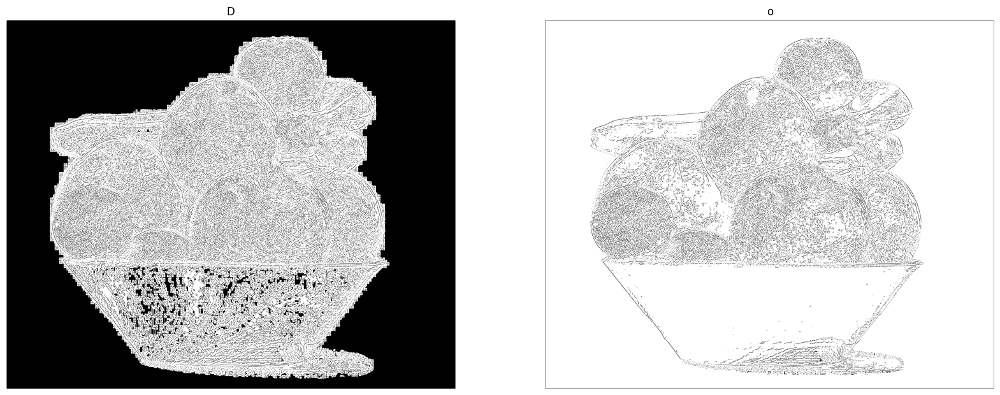

In [97]:
# step 4: double thresholding
def double_thresholding(magnitude_nms, tau, strong, weak):
    # input: magnitude (B, C, H, W), low (float), high (float)
    # output: magnitude (B, C, H, W)
    high_threshold = magnitude_nms.max() * tau
    low_threshold = high_threshold * 0.5
    
    # return a binary image, where then value is higher than the high_threshold is strong and the value is higher than the low_threshold but lower than the high_threshold is weak
    thresholded_magnitude = torch.zeros_like(magnitude_nms)
    thresholded_magnitude[magnitude_nms > high_threshold] = strong
    thresholded_magnitude[(magnitude_nms < high_threshold) & (magnitude_nms > low_threshold)] = weak
    return thresholded_magnitude

strong = torch.tensor(255.)
weak = torch.tensor(100.)

# show(torch.cat(img_pile, dim=0), title=[f"threshold={threshold}" for threshold in threshold_list], figsize=(50, 50))

thresholded_magnitude = double_thresholding(magnitude_nms, 0.01, strong, weak)
img_pile = torch.cat([1 - magnitude_nms.clamp(0,1), 1 - thresholded_magnitude.clamp(0,1)], dim=0)
show(img_pile, cmap='gray', title="Double Thresholding", figsize=(20, 20))


showing 4d image


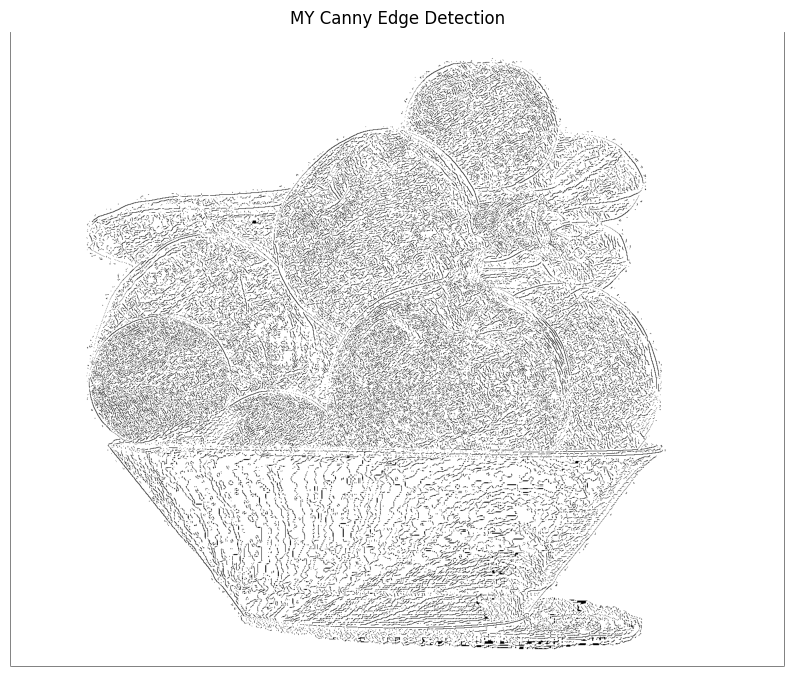

In [98]:
def MyCanny(img, sigma, tau):
    # input: img (B, C, H, W), sigma (float)
    # output: canny_img (B, C, H, W)
    strong = torch.tensor(255.)
    weak = torch.tensor(100.)
    gau_img = add_noise(img, sigma)
    magnitude, direction = compute_gradient(gau_img)
    direction_45 = classify_direction(direction)
    magnitude_nms = non_max_suppression_fast(magnitude, direction_45)
    canny_img = double_thresholding(magnitude_nms, tau, strong, weak)
    return canny_img

mycanny_img = MyCanny(gray_img, 1.1, 0.004)
show(1. - mycanny_img.clamp(0., 1.), cmap='gray', title="MY Canny Edge Detection")


showing 4d image


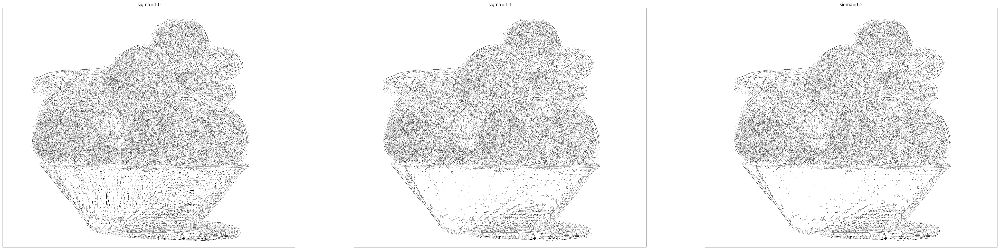

In [99]:
# tau_range = [0.004,0.0045,0.005]
# img_pile = []
# for tau in tau_range:
#     canny_img = MyCanny(gray_img, 1, tau)
#     img_pile.append(1. - canny_img.clamp(0., 1.))

# show(torch.cat(img_pile, dim=0), title=[f"tau={tau}" for tau in tau_range], figsize=(50, 50))

sigma_range = [1.0,1.1,1.2]
img_pile = []
for sigma in sigma_range:
    canny_img = MyCanny(gray_img, sigma, 0.0047)
    img_pile.append(1. - canny_img.clamp(0., 1.))

show(torch.cat(img_pile, dim=0), title=[f"sigma={sigma}" for sigma in sigma_range], figsize=(50, 50))


showing 4d image


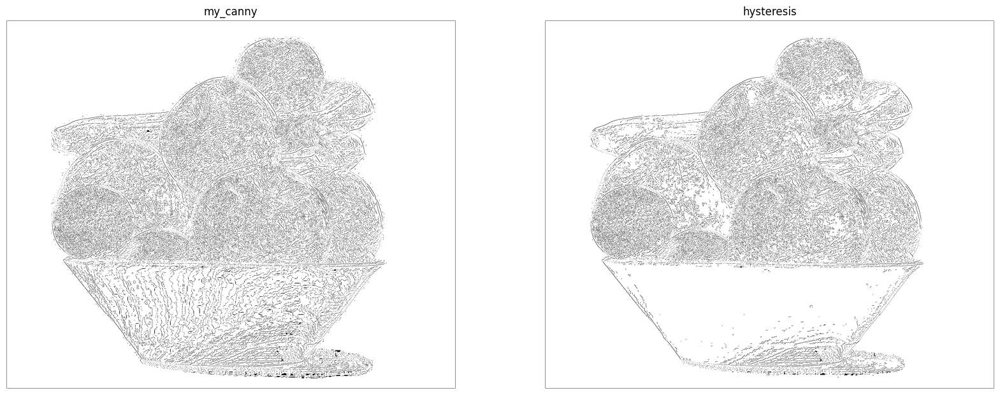

In [100]:
# step 5: hysteresis

def hysteresis(magnitude, weak, strong):
    # input: magnitude (B, C, H, W), weak (float), strong (float)
    # output: magnitude (B, C, H, W)
    magnitude = magnitude.squeeze(0).squeeze(0)
    H, W = magnitude.shape

    for i in tqdm(range(1, H-1)):
        for j in range(1, W-1):
            if magnitude[i, j] == weak:
                if (magnitude[i-1:i+2, j-1:j+2] == strong).any():
                    magnitude[i, j] = strong
                else:
                    magnitude[i, j] = 0
    return magnitude.unsqueeze(0).unsqueeze(0)

def hysteresis_fast(magnitude, weak, strong):    
    # input: magnitude (B, C, H, W), weak (float), strong (float)
    # output: magnitude (B, C, H, W)
    magnitude = magnitude.clone()
    magnitude = magnitude.squeeze(0).squeeze(0)
    H, W = magnitude.shape


    pad = torch.nn.ConstantPad2d(1, 0)
    magnitude_padded = pad(magnitude)

    weak_mask = (magnitude == weak)
    strong_neighbourhood = torch.nn.functional.max_pool2d((magnitude_padded.unsqueeze(0).unsqueeze(0) == strong).float(), kernel_size=3, stride=1, padding=0).squeeze(0).squeeze(0).bool()

    magnitude[weak_mask] = torch.where(strong_neighbourhood[weak_mask], strong, 0)

    return magnitude.unsqueeze(0).unsqueeze(0)

hysteresis_img = hysteresis_fast(mycanny_img, weak, strong)

img_pile = torch.cat([1 - mycanny_img.clamp(0,1), 1 - hysteresis_img.clamp(0,1)], dim=0)
show(img_pile, cmap='gray', title=["my_canny", "hysteresis"], figsize=(20, 20))

showing 4d image


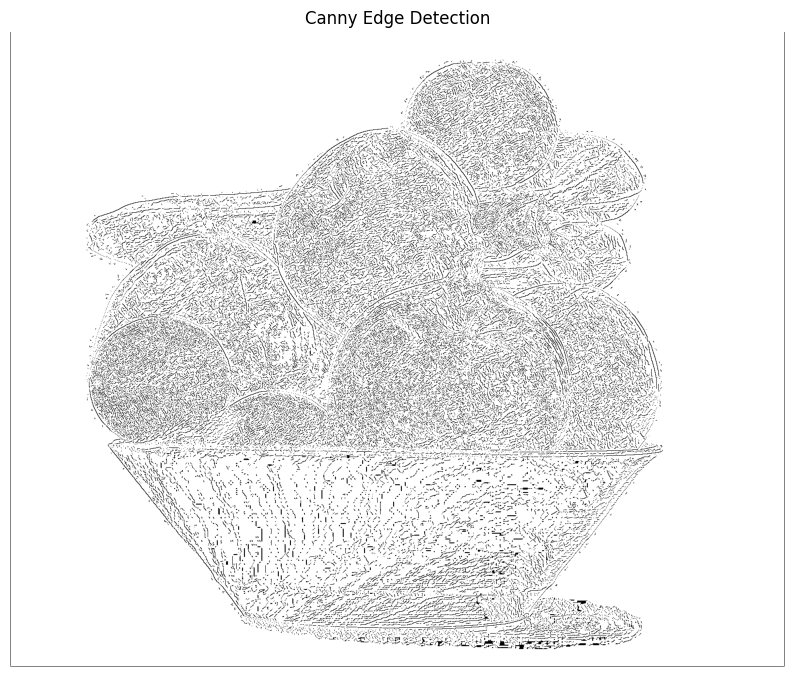

In [101]:
def CannyFull(img, sigma, tau, verbose=False):
    weak = torch.tensor(100.)
    strong = torch.tensor(255.)
    my_canny_img = MyCanny(img, sigma, tau)
    full_canny_img = hysteresis_fast(my_canny_img, weak, strong)
    return full_canny_img

full_canny_img = CannyFull(gray_img, 1.07, 0.0023, verbose=True)
show(1 - full_canny_img.clamp(0., 1.), cmap='gray', title="Canny Edge Detection")

showing 4d image


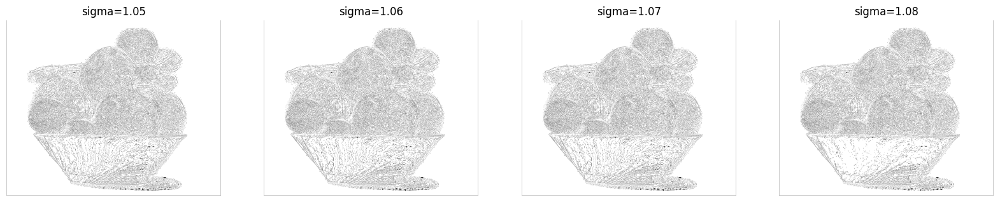

In [102]:
# threshold_list = [0.0022, 0.0023, 0.0024]
# img_pile = []
# for threshold in threshold_list:
#     canny_img = CannyFull(gray_img, 1, threshold)
#     img_pile.append(1 - canny_img.clamp(0., 1.))

# show(torch.cat(img_pile, dim=0), title=[f"threshold={threshold}" for threshold in threshold_list], figsize=(20, 20))

sigma_range = [1.05, 1.06, 1.07, 1.08]
img_pile = []
for sigma in sigma_range:
    canny_img = CannyFull(gray_img, sigma, 0.0023)
    img_pile.append(1 - canny_img.clamp(0., 1.))

show(torch.cat(img_pile, dim=0), title=[f"sigma={sigma}" for sigma in sigma_range], figsize=(20, 20))

# Q2. Seam carving

showing 3d image


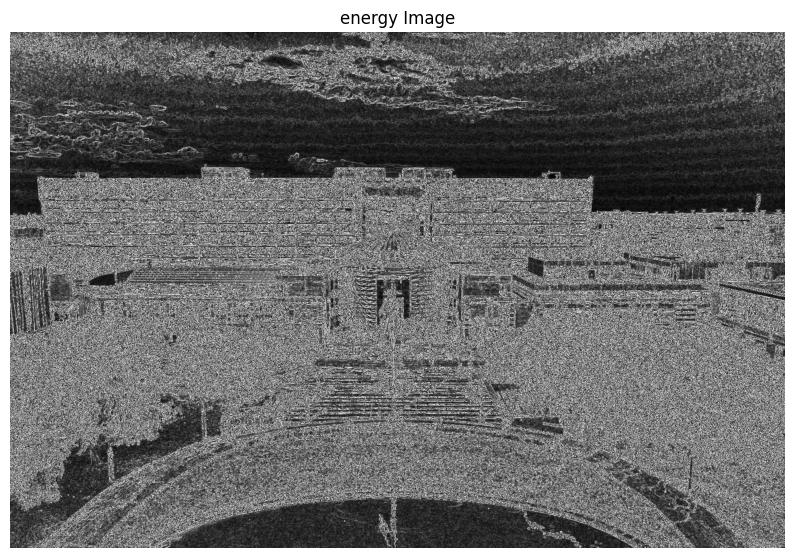

In [5]:
# 1. Read the image
input_image = torchvision.io.read_image("img/York.jpg").to(torch.float32).unsqueeze(0)

# 2. compute the energy image
def compute_energy_image(img):
    # input: img (B, C, H, W)
    # output: energy_image (H, W)
    # Apply spatial gradient to compute gradient magnitude images
    gradient = kornia.filters.spatial_gradient(img, mode='sobel', normalized=False) # [1, 3, 2, 1312, 1600]
    gradient_x = gradient[:, :, 0]
    gradient_y = gradient[:, :, 1] # [1, 3, 1312, 1600]

    # Compute the gradient magnitude images
    sum_direction = torch.abs(gradient_x) + torch.abs(gradient_y)
    sum_channel = sum_direction.sum(dim=1).squeeze(0) # [1312, 1600]

    return sum_channel


energy_image = compute_energy_image(input_image)
# Display the original and energy images
show(energy_image.unsqueeze(0), title="energy Image", cmap='gray')   


In [6]:
# step 3: find the minimum seam
def minimum_seam(energy_img):
    # input: energy_img (H, W)
    # output: M (H, W), backtrack (H, W)
    H, W = energy_img.shape
    M = energy_img.clone()
    backtrack = torch.zeros_like(M, dtype=torch.int)

    for i in tqdm(range(1, H)):
        for j in range(0, W):
            if j == 0:
                idx = torch.argmin(M[i-1, j:j+2])
                backtrack[i, j] = idx + j
                min_energy = M[i-1, idx+j]
            elif j == W-1:
                idx = torch.argmin(M[i-1, j-1:j+1])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx+j-1]
            else:
                idx = torch.argmin(M[i-1, j-1:j+2])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx+j-1]

            M[i, j] += min_energy
    
    return M, backtrack

def minimum_seam_fast(energy_img):
    H, W = energy_img.shape
    M = energy_img.clone()
    backtrack = torch.zeros_like(M, dtype=torch.int)

    for i in range(1, H):
        left_shifted = torch.cat([M[i-1, 1:], M[i-1, -1:]], dim=0)
        right_shifted = torch.cat([M[i-1, :1], M[i-1, :-1]], dim=0)

        min_energy, idx = torch.min(torch.stack([right_shifted, M[i-1, :], left_shifted]), dim=0)
        # print(torch.stack([right_shifted, M[i-1, :], left_shifted]))
        # print(torch.min(torch.stack([right_shifted, M[i-1, :], left_shifted]), dim=0))
        idx = idx - 1
        backtrack[i, :] = idx
        M[i, :] += min_energy

    return M, backtrack

# M, backtrack = minimum_seam(energy_image)
M, backtrack = minimum_seam_fast(energy_image)

showing 4d image


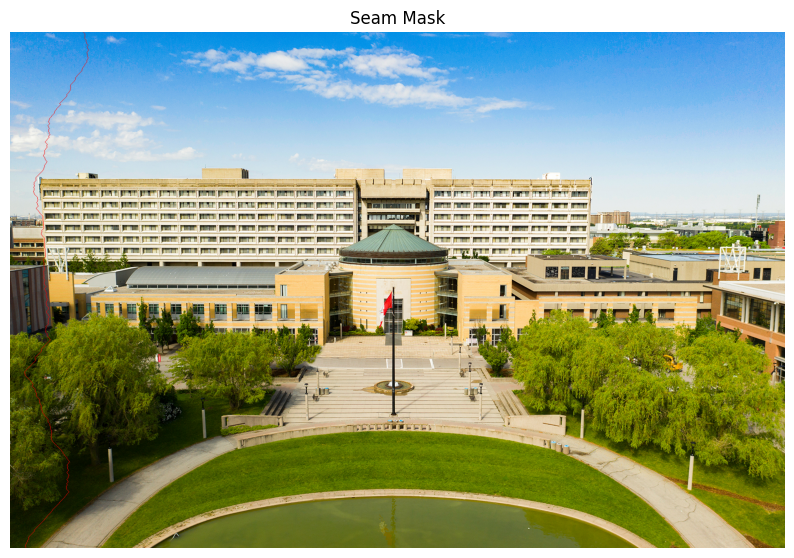

In [7]:
# 4. find the minimum seam
def find_seam(img, backtrack, starting_point=None):
    # input: img (H, W), backtrack (H, W)
    # output: img (H, W-1)
    H, W = img.shape[-2], img.shape[-1]
    mask = torch.zeros(H, W, dtype=torch.bool)

    j = starting_point if starting_point is not None else torch.argmin(img[-1])
    
    for i in range(H-1, -1, -1):
        mask[i, j] = 1
        j = j+ backtrack[i, j] # for non-fast version, j = backtrack[i, j]
        j = max(0, j)
    return mask

# let the index in original image red when the seam is masked
seam_mask = find_seam(M, backtrack)
seam_img = input_image.clone()
seam_img[0, 0, seam_mask] = 255
seam_img[0, 1, seam_mask] = 0
seam_img[0, 2, seam_mask] = 0
show(seam_img, title="Seam Mask")

showing 4d image
original image shape: torch.Size([1, 3, 1151, 1728]), cropped image shape: torch.Size([1, 3, 1151, 1727])


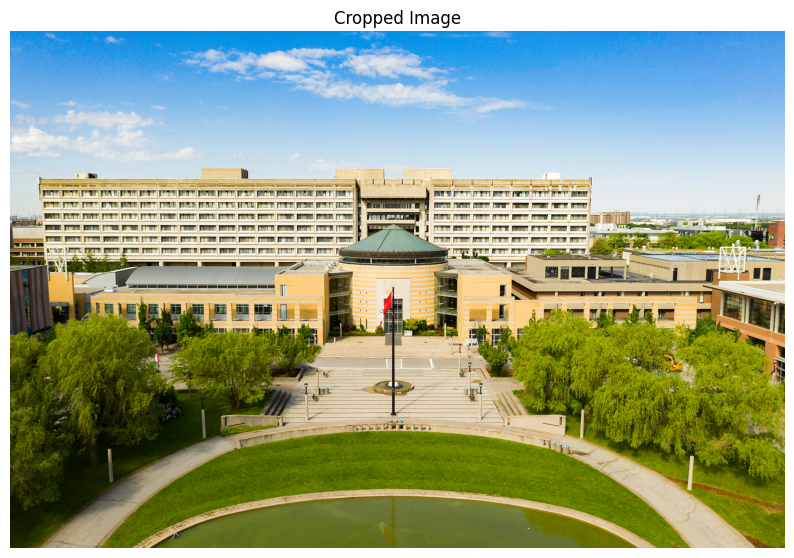

In [8]:
# 5. remove the minimum seam

def crop_column(img, mask):
    # input: img (B, C, H, W), mask (H, W)
    # output: img (B, C, H, W-1)
    B, C, H, W = img.shape
    # Invert the mask and expand its dimensions to match the image
    mask = ~mask.unsqueeze(0).unsqueeze(0).repeat(1, img.shape[1], 1, 1)
    # Apply the mask to the image
    out_img = img[mask]

    # Reshape the image to its new shape
    out_img = out_img.view(img.shape[0], img.shape[1], img.shape[2], img.shape[3]-1)

    return out_img

cropped_img = crop_column(seam_img, seam_mask)
show(cropped_img, title="Cropped Image")
print(f"original image shape: {input_image.shape}, cropped image shape: {cropped_img.shape}")

In [9]:
# get together

def seam_carving(img, num_seams, mode='V'):
    # input: img (B, C, H, W), num_seams (int)
    # output: img (B, C, H, W-num_seams)
    if mode == 'H':
        img = img.permute(0, 1, 3, 2)
    for i in tqdm(range(num_seams)):
        energy_img = compute_energy_image(img)
        M, backtrack = minimum_seam_fast(energy_img)
        seam_mask = find_seam(M, backtrack)
        img = crop_column(img, seam_mask)
    if mode == 'H':
        img = img.permute(0, 1, 3, 2)
    return img

my_carved_img_V = seam_carving(input_image, 1728-1200)
show(my_carved_img_V, title="Carved")
print(f"original image shape: {input_image.shape}, carved image shape: {my_carved_img_V.shape}")

  2%|▏         | 11/528 [00:02<02:03,  4.20it/s]


KeyboardInterrupt: 

100%|██████████| 431/431 [03:29<00:00,  2.06it/s]


showing 4d image
original image shape: torch.Size([1, 3, 1151, 1728]), carved image shape: torch.Size([1, 3, 720, 1728])


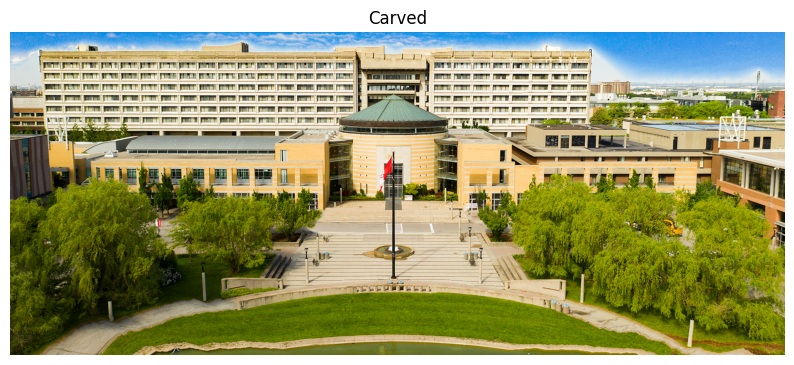

In [36]:
my_carved_img_H = seam_carving(input_image, 1151-720, mode='H')
show(my_carved_img_H, title="Carved")
print(f"original image shape: {input_image.shape}, carved image shape: {my_carved_img_H.shape}")

## insertion

Inserting seams: 100%|██████████| 10/10 [00:00<00:00, 28.64it/s]


showing 4d image
original image shape: torch.Size([1, 3, 275, 183]), inserted image shape: torch.Size([1, 3, 275, 193])


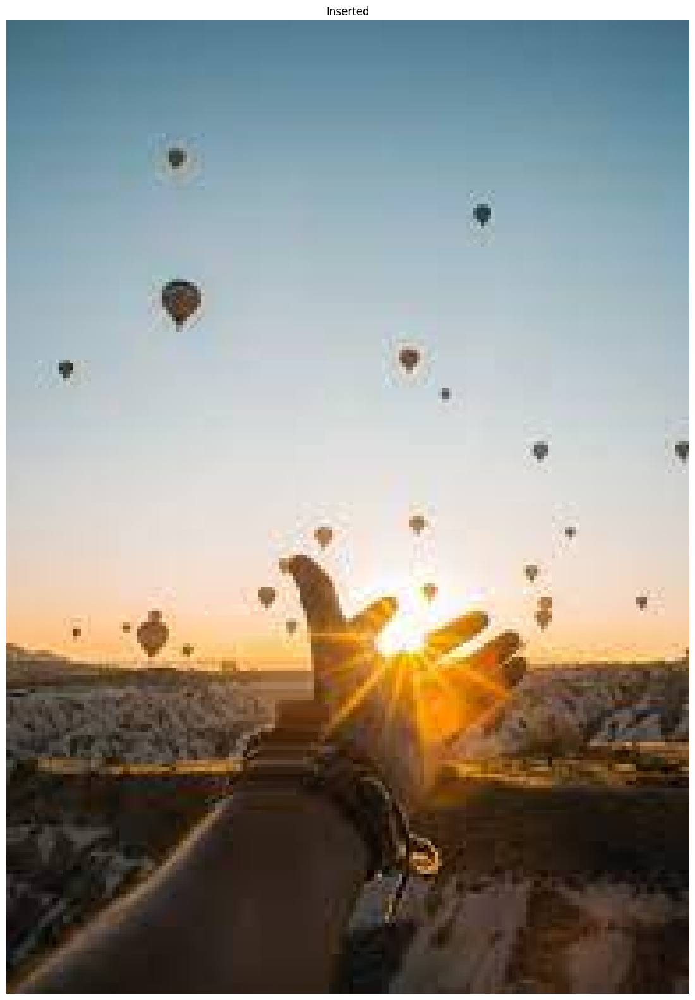

In [13]:
# Seam insertion

def seam_insert(img, num_seams, mode='V'):
    # input: img (B, C, H, W), num_seams (int)
    # output: img (B, C, H, W+num_seams)
    if mode == 'H':
        img = img.permute(0, 1, 3, 2)

    energy_img = compute_energy_image(img)
    M, backtrack = minimum_seam_fast(energy_img)

    starting_points = torch.topk(M[-1], num_seams, largest=False).indices
    offsets = torch.zeros_like(starting_points)
    for i in tqdm(range(len(starting_points)), desc='Inserting seams'):
        starting_point = starting_points[i]
        seam_mask = find_seam(M, backtrack, starting_point)
        # insert the number of offset[i] columns of zeros in the beginning of the seam mask
        seam_mask = torch.cat([torch.zeros_like(seam_mask[:, :offsets[i]]), seam_mask], dim=-1) 
        if seam_mask.shape[1] < img.shape[3]:
            padding = torch.zeros(seam_mask.shape[0], img.shape[3] - seam_mask.shape[1], dtype=seam_mask.dtype, device=seam_mask.device)
            seam_mask = torch.cat([seam_mask, padding], dim=-1)
        # in the list of starting points, where the index is greater or equal than the current index, the offset is increased by 1
        show_img = img.clone()
        show_img[0, 0, seam_mask] = 255
        show_img[0, 1, seam_mask] = 0
        show_img[0, 2, seam_mask] = 0
        
        img = insert_column(img, seam_mask)
        torchvision.utils.save_image(img.squeeze(0), f"img/ori/inserted_{i}.jpg")
        torchvision.utils.save_image(show_img.squeeze(0), f"img/red/red_{i}.jpg")
        offsets[starting_points >= starting_point] += 1
    if mode == 'H':
        img = img.permute(0, 1, 3, 2)
    return img

def insert_column(img, mask):
    # input: img (B, C, H, W), mask (H, W)
    # output: img (B, C, H, W+1)

    # Find the column indices where the mask is True for each row
    col_indices = torch.where(mask)[1]

    # Initialize the output image
    out_img = torch.zeros(img.shape[0], img.shape[1], img.shape[2], img.shape[3]+1)

    # For each row, calculate the mean of the pixel and the next one, and insert it
    for row_index, col_index in enumerate(col_indices):
        # Calculate the mean of the pixel and the next one
        mean_pixel_right = img[..., row_index, col_index:col_index+2].mean(dim=-1, keepdim=True)
        mean_pixel_left = img[..., row_index, col_index-1:col_index+1].mean(dim=-1, keepdim=True)
        mean_pixel_right = mean_pixel_right.squeeze(-1)
        mean_pixel_left = mean_pixel_left.squeeze(-1)
        # Insert the mean pixel into the output image
        out_img[..., row_index, :col_index+1] = img[..., row_index, :col_index+1]
        out_img[..., row_index, col_index] = mean_pixel_left
        out_img[..., row_index, col_index+1] = mean_pixel_right
        out_img[..., row_index, col_index+2:] = img[..., row_index, col_index+1:]

    return out_img

input_image = torchvision.io.read_image("img/hand.jpg").to(torch.float32).unsqueeze(0)
my_inserted_img_V = seam_insert(input_image, 10)
show(my_inserted_img_V, title="Inserted", figsize=(20, 20))
print(f"original image shape: {input_image.shape}, inserted image shape: {my_inserted_img_V.shape}")


Inserting seams:   0%|          | 0/100 [00:00<?, ?it/s]

Inserting seams: 100%|██████████| 100/100 [00:01<00:00, 54.57it/s]

showing 4d image
original image shape: torch.Size([1, 3, 275, 183]), inserted image shape: torch.Size([1, 3, 375, 183])


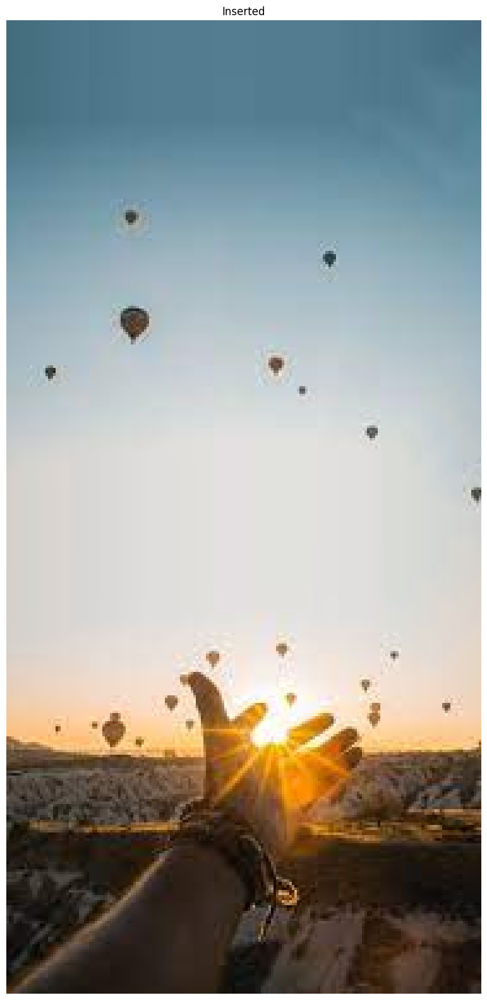

In [11]:
my_inserted_img_H = seam_insert(input_image, 100, mode='H')
show(my_inserted_img_H, title="Inserted", figsize=(20, 20))
print(f"original image shape: {input_image.shape}, inserted image shape: {my_inserted_img_H.shape}")

In [59]:
torch.eq(my_inserted_img_V, input_image).all()

tensor(True)